In [ ]:
#pip install -e C:/Users/pierr/Desktop/COOMM

In [1]:
from elastica import *
import pickle
import numpy as np
from coomm import *
from coomm.src_plotting import *

ModuleNotFoundError: No module named 'elastica'

In [11]:
class LinearRod(BaseSystemCollection, Constraints, Damping, Forcing, CallBacks):
    pass

Rod = LinearRod()

n_elements = 100        # number of discretized elements
base_length = 0.5       # total length
radius = 0.05

s = np.linspace(0,1,n_elements+1)
w = np.pi/2
A = 0.1

position = base_length*np.array([s-A*np.sin(w*s),np.zeros(n_elements+1),A*np.sin(w*s)])


d1 = np.array([np.ones(n_elements),np.zeros(n_elements),np.zeros(n_elements)])
d2 = np.array([np.zeros(n_elements),np.convolve(np.sin(w*s), np.ones(2), 'valid') / 2,np.convolve(-np.cos(w*s), np.ones(2), 'valid') / 2])
d3 = np.array([np.zeros(n_elements),np.convolve(np.cos(w*s), np.ones(2), 'valid') / 2,np.convolve(1 + np.sin(w*s), np.ones(2), 'valid') / 2])
directors = np.stack([d1,d2,d3],axis=0)



direction = np.array([1.0, 0.0, 0.0])

origin_force = np.array([1.0e-5, 0.0, 0.0])*0
end_force = np.array([0.0, 0.0, 0.0])+1.0e-3
ramp_up_time_force = 10

origin_torque = np.array([0, 0.0, 0.0])
end_torque = np.array([0.0, 5.0e-4, 0.0])*0
ramp_up_time_torque = 1.0

dt = 1e-5

shearable_rod = CosseratRod.straight_rod(
    n_elements=n_elements,
    start=np.zeros((3,)),
    direction=direction,
    normal=np.array([0.0, 1.0, 0.0]),
    base_length=base_length,
    base_radius=radius,
    density=1050,
    youngs_modulus=1e5,
    shear_modulus=1e5 / (2*(1 + 0.5)),
    position = position,
    #directors = directors
    # poisson_ratio=0.5, Default is 0.5
    #nu_for_torques=damp_coefficient*((radius_mean/radius_base)**4),
)
Rod.append(shearable_rod)


""" Add damping """
damping_constant = 0.05
Rod.dampen(shearable_rod).using(
    AnalyticalLinearDamper,
    damping_constant=damping_constant,
    time_step=dt,
)



""" Set up boundary conditions """
Rod.constrain(shearable_rod).using(
    GeneralConstraint,
    constrained_position_idx=(0,),
    constrained_director_idx=(0,),
    #translational_constraint_selector=np.array([False, True, True]),  # Allow X movement, fix Y & Z
    translational_constraint_selector=np.array([True, True, True]),  # Allow X movement, fix Y & Z
    rotational_constraint_selector=np.array([True, True, True])  # Fix all rotations
)


Rod.constrain(shearable_rod).using(
    GeneralConstraint,
    constrained_position_idx=(-1,),
    constrained_director_idx=(-1,),
    rod_frame_bool = True,
    #translational_constraint_selector=np.array([False, False, True]),  
    translational_constraint_selector=np.array([False, False, False]),  
    rotational_constraint_selector=np.array([False, False, False]) 
)


#Rod.add_forcing_to(shearable_rod).using(
#    EndpointTorque, origin_torque, end_torque, ramp_up_time=ramp_up_time_torque
#)

#Rod.add_forcing_to(shearable_rod).using(
#    UniformTorques, 1.0e-4, direction = np.array([1,0,0])
#)

Rod.add_forcing_to(shearable_rod).using(
    EndpointForces, origin_force, end_force, ramp_up_time=ramp_up_time_force
)

In [12]:
class RodCallBack(CallBackBaseClass):
    """
    Call back function for Bean Ogeden penetration
    """

    def __init__(self, step_skip: int, callback_params: dict):
        CallBackBaseClass.__init__(self)
        self.every = step_skip
        self.callback_params = callback_params

    def make_callback(self, system, time, current_step: int):

        if current_step % self.every == 0:

            self.callback_params["time"].append(time)
            self.callback_params["step"].append(current_step)
            self.callback_params["position"].append(system.position_collection.copy())
#            self.callback_params["velocity"].append(system.velocity_collection.copy())
#            self.callback_params["avg_velocity"].append(
#                system.compute_velocity_center_of_mass()
#            )

#            self.callback_params["center_of_mass"].append(
#                system.compute_position_center_of_mass()
#            )
            self.callback_params["curvature"].append(system.kappa.copy())
            self.callback_params["sigma"].append(system.sigma.copy())
            self.callback_params["internal_stress"].append(system.internal_stress.copy())
            self.callback_params["internal_couple"].append(system.internal_couple.copy())
            self.callback_params["directors"].append(system.director_collection.copy())
            
            return


step_skip=1000
pp_list = defaultdict(list)
Rod.collect_diagnostics(shearable_rod).using(
    RodCallBack, step_skip=step_skip, callback_params=pp_list
)

In [13]:
Rod.finalize()
print("System finalized")

System finalized


In [14]:
final_time = 1.0
total_steps = int(final_time / dt)
print("Total steps to take", total_steps)

timestepper = PositionVerlet()

Total steps to take 99999


In [15]:
integrate(timestepper, Rod, final_time, total_steps)

positions_over_time = np.array(pp_list["position"])
if (np.isnan(positions_over_time)==False).all()==False:
    print("Simulation diverge. Try lowering time step !")

100%|██████████| 99999/99999 [00:19<00:00, 5164.80it/s]

Final time of simulation is :  0.9999999999973068


In [16]:
with open("simulation_data.pickle", 'wb') as handle:
    pickle.dump(pp_list, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [17]:
with open("simulation_data.pickle", 'rb') as handle:
    pp_list_read = pickle.load(handle)

solution_1 = process_solution_data(pp_list_read, step_skip=step_skip, base_length=base_length)


In [18]:
solution_1[solution_1.Index_solution==solution_1.Index_solution.max()]

,Index_solution,time,step,s,X,Y,Z,d3x,d3y,d3z,...,d2z,R1,R2,R3,m1,m2,m3,k1,k2,k3
9999,99,0.99001,99000,0.00,0.000000,0.000000e+00,0.000000,0.983078,0.000000e+00,0.183189,...,0.983078,0.000114,0.111257,-0.163510,-1.679601e-07,-1.679601e-07,-1.679601e-07,-5.132482e-07,-5.132482e-07,-5.132482e-07
10000,99,0.99001,99000,0.01,0.008427,3.868611e-09,0.001574,0.982943,4.045456e-07,0.183912,...,0.982943,0.000114,0.100252,-0.158784,-1.681626e-07,-1.681626e-07,-1.681626e-07,-5.138672e-07,-5.138672e-07,-5.138672e-07
10001,99,0.99001,99000,0.02,0.016853,1.120402e-08,0.003154,0.982808,8.048979e-07,0.184630,...,0.982808,0.000114,0.084955,-0.173853,-1.684227e-07,-1.684227e-07,-1.684227e-07,-5.146618e-07,-5.146618e-07,-5.146618e-07
10002,99,0.99001,99000,0.03,0.025278,2.196302e-08,0.004740,0.982673,1.200717e-06,0.185345,...,0.982673,0.000113,0.072047,-0.206992,-1.685870e-07,-1.685870e-07,-1.685870e-07,-5.151640e-07,-5.151640e-07,-5.151640e-07
10003,99,0.99001,99000,0.04,0.033703,3.610937e-08,0.006331,0.982539,1.591838e-06,0.186056,...,0.982539,0.000113,0.069775,-0.237514,-1.685776e-07,-1.685776e-07,-1.685776e-07,-5.151353e-07,-5.151353e-07,-5.151353e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10095,99,0.99001,99000,0.96,0.847497,1.198844e-05,0.182776,0.974428,2.032356e-05,0.224699,...,0.974428,0.000100,0.042578,-0.010585,-1.137521e-08,-1.137521e-08,-1.137521e-08,-3.476009e-08,-3.476009e-08,-3.476009e-08
10096,99,0.99001,99000,0.97,0.857157,1.219385e-05,0.185005,0.974425,2.033677e-05,0.224711,...,0.974425,0.000100,0.049745,-0.030961,-7.531766e-09,-7.531766e-09,-7.531766e-09,-2.301538e-08,-2.301538e-08,-2.301538e-08
10097,99,0.99001,99000,0.98,0.866841,1.239991e-05,0.187240,0.974423,2.034542e-05,0.224720,...,0.974423,0.000100,0.010520,-0.027669,-3.825129e-09,-3.825129e-09,-3.825129e-09,-1.168873e-08,-1.168873e-08,-1.168873e-08
10098,99,0.99001,99000,0.99,0.876549,1.260654e-05,0.189479,0.974422,2.034986e-05,0.224726,...,0.974422,0.000099,0.032514,-0.006508,-3.825129e-09,-3.825129e-09,-3.825129e-09,-1.168873e-08,-1.168873e-08,-1.168873e-08


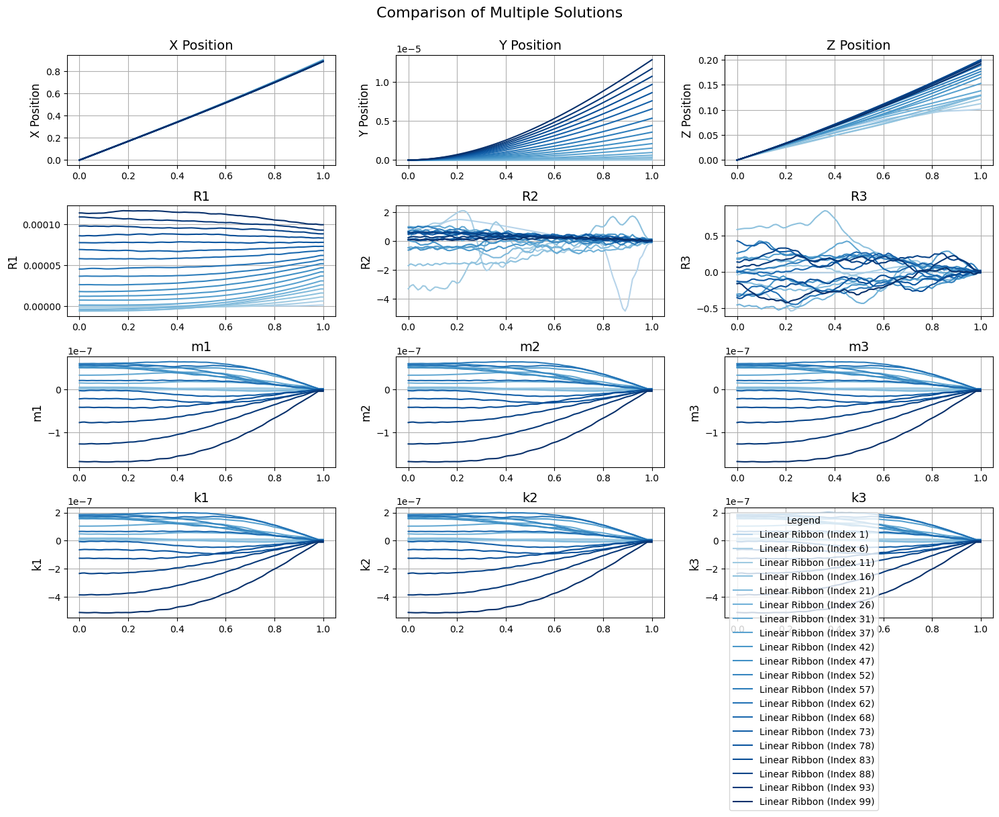

In [19]:
fig = plot_multiple_solutions(
    solution_dfs=[solution_1],
    labels=["Linear Ribbon"],
    indices=np.linspace(1,solution_1.Index_solution.max(),20,dtype=np.int64), 
)

In [20]:
fig = plot_3D_ribbons_from_process_solution(solution_1, solution_indices=np.linspace(1,solution_1.Index_solution.max(),5,dtype=np.int64),n_arrows = 3)

Indice of the solution: 1
X_max: 0.900
Y_max: 0.000
Z_max: 0.101

Indice of the solution: 25
X_max: 0.897
Y_max: 0.000
Z_max: 0.128

Indice of the solution: 50
X_max: 0.890
Y_max: 0.000
Z_max: 0.174

Indice of the solution: 74
X_max: 0.885
Y_max: 0.000
Z_max: 0.200

Indice of the solution: 99
X_max: 0.886
Y_max: 0.000
Z_max: 0.192

